In [12]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import warnings
import pandas as pd
from joblib import Parallel, delayed
import numpy as np

In [3]:
gray_green = LinearSegmentedColormap.from_list(
    "gray_green", ["#D3D3D3", "#02500e", "#001203"]
)
gray_orange = LinearSegmentedColormap.from_list(
    "gray_orange", ["#D3D3D3", "#f76d48", "#FA4616"]
)

In [4]:
adata_transformed = ad.read_h5ad("/blue/square.t/peter.huynh/jupyter/combined_samples_scvelo/p4/data/processed/p4_adata_clustered_(36,34)_(0.3,1.3)_8_3_25.h5ad")

In [13]:
# set once in the main process
warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    message=r".*na_action.*Categorical\.map.*",
)
warnings.filterwarnings(
    "ignore",
    category=UserWarning,
    message=r"No data for colormapping provided via 'c'.*cmap.*",)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

In [11]:
#importing subset from loupe
barcodes = pd.read_csv("/blue/square.t/peter.huynh/jupyter/combined_samples_scvelo/p4/data/external/p4_epi_subset.csv")["Barcode"].tolist()

# Remove "-1" and add prefix/suffix
barcodes_full = ["plus4_v5e_062522_forced6k_possorted_genome_bam_CRXMJ:" + bc.replace("-11", "x") for bc in barcodes]

# Subset AnnData
adata_subset = adata_transformed[adata_transformed.obs_names.isin(barcodes_full)].copy()

In [5]:
keep = [2,10,11, 12]
adata_subset = adata_transformed[adata_transformed.obs["leiden"].isin(map(str, keep))].copy()

In [6]:
adata_subset

AnnData object with n_obs × n_vars = 1037 × 2000
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [7]:
#save point
adata_subset_test=adata_subset.copy()


▶ Batch 1/57 | Combos 1–4


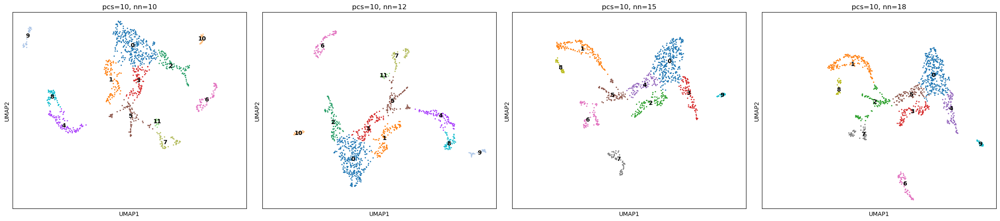


▶ Batch 2/57 | Combos 5–8


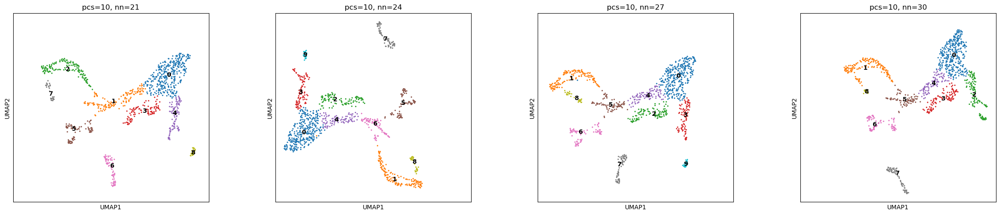


▶ Batch 3/57 | Combos 9–12


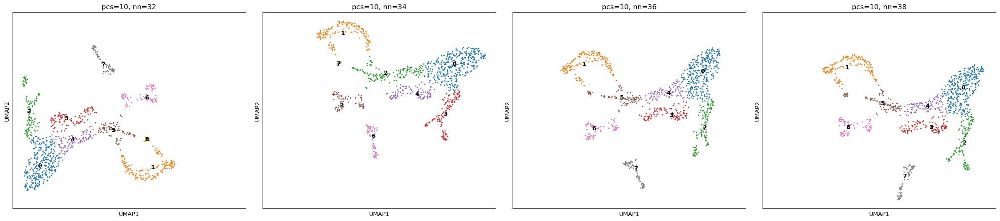


▶ Batch 4/57 | Combos 13–16


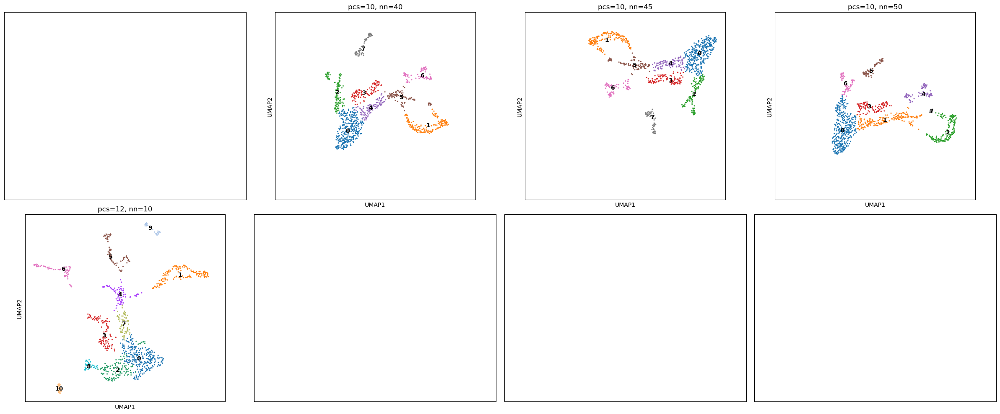


▶ Batch 5/57 | Combos 17–20


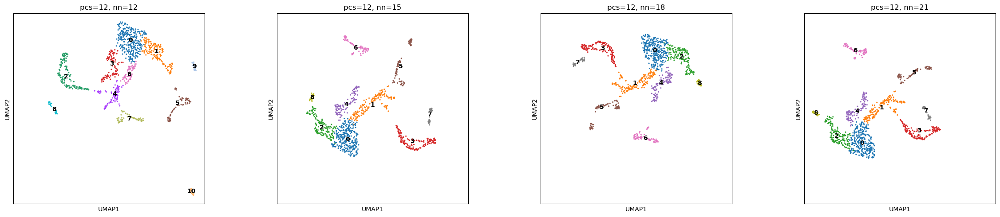


▶ Batch 6/57 | Combos 21–24


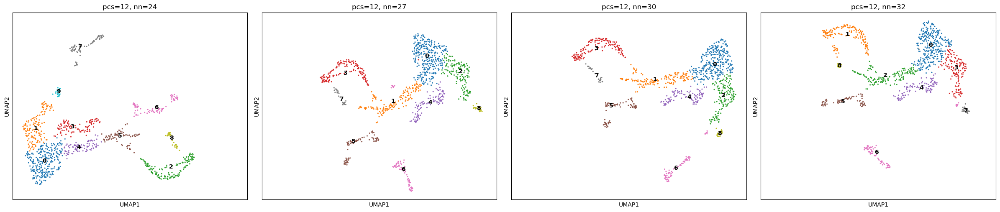


▶ Batch 7/57 | Combos 25–28


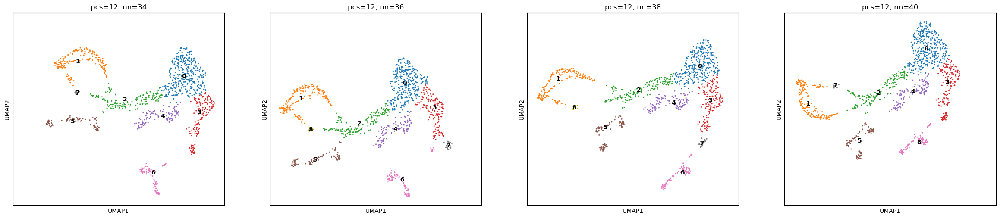


▶ Batch 8/57 | Combos 29–32


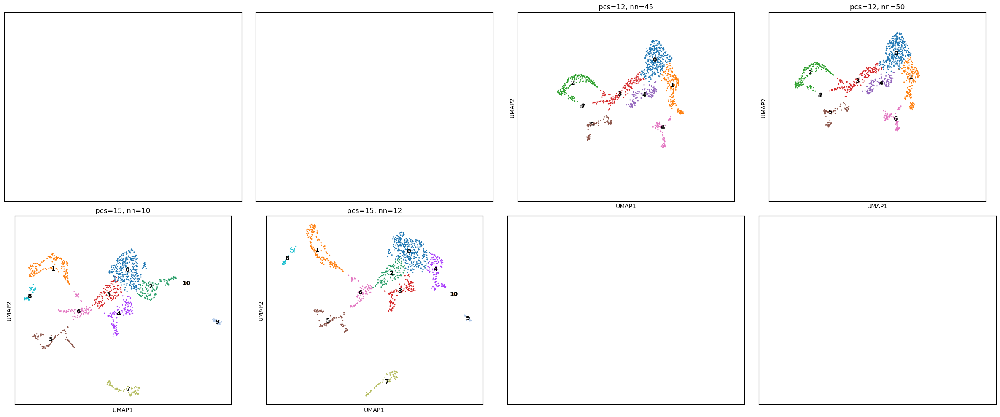


▶ Batch 9/57 | Combos 33–36


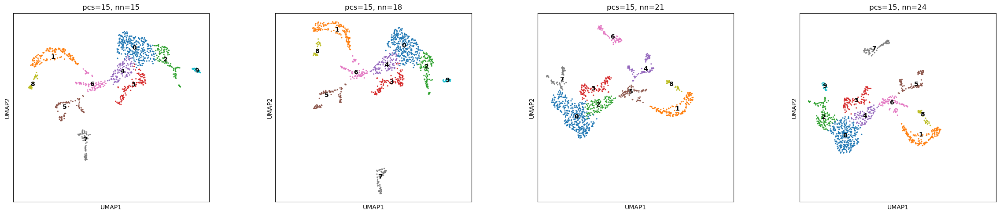


▶ Batch 10/57 | Combos 37–40


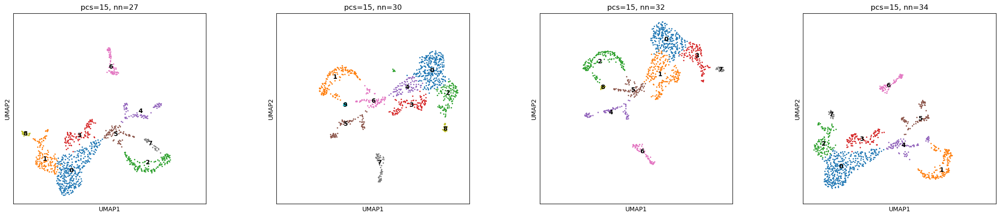


▶ Batch 11/57 | Combos 41–44


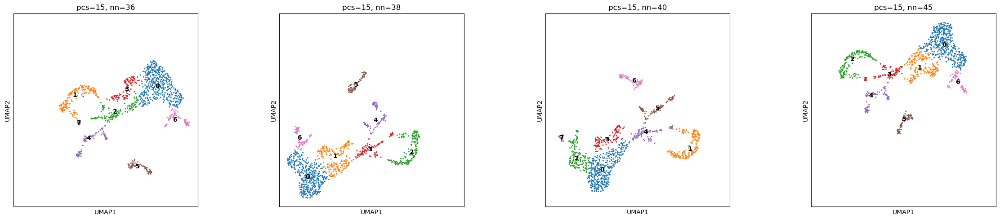


▶ Batch 12/57 | Combos 45–48


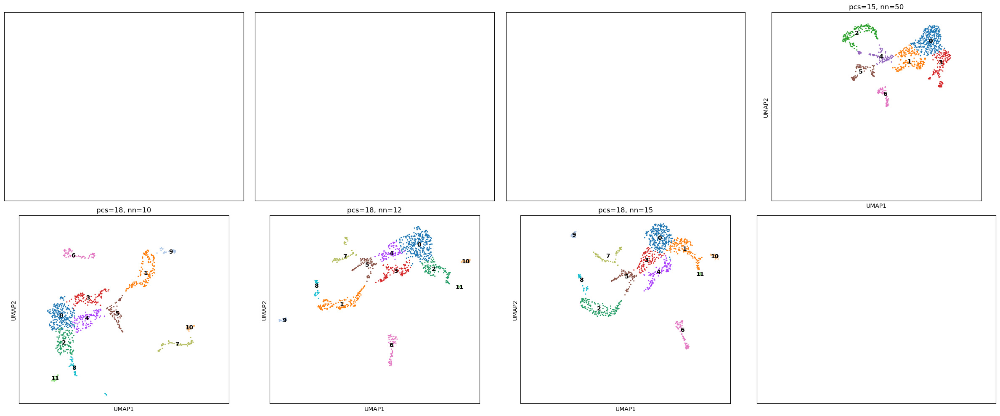


▶ Batch 13/57 | Combos 49–52


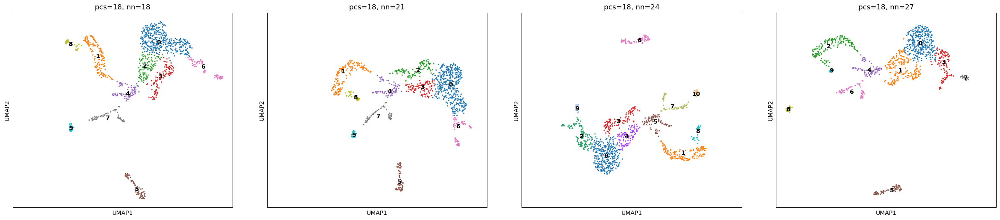


▶ Batch 14/57 | Combos 53–56


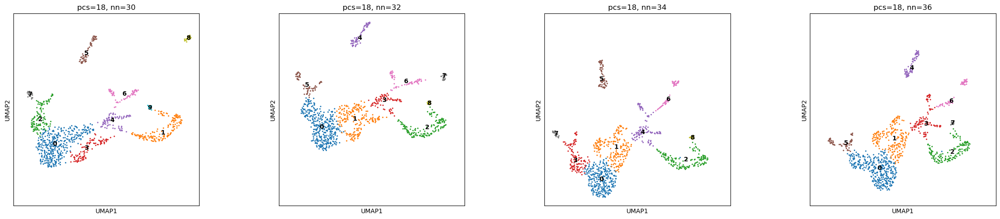


▶ Batch 15/57 | Combos 57–60


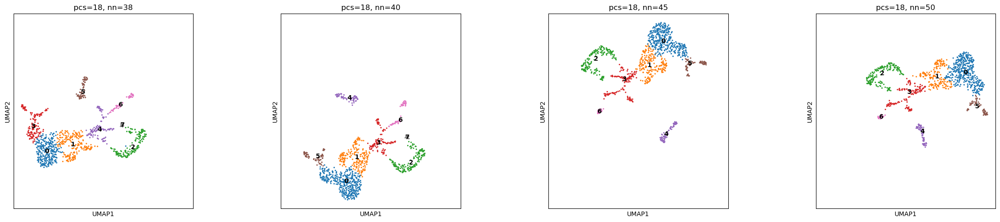


▶ Batch 16/57 | Combos 61–64


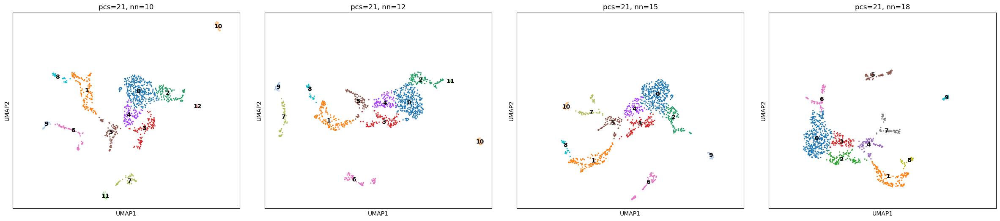


▶ Batch 17/57 | Combos 65–68


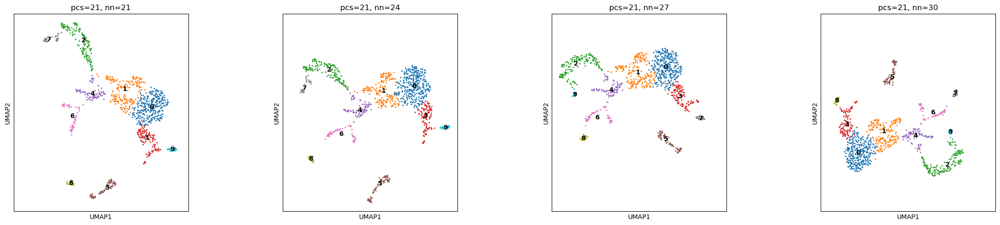


▶ Batch 18/57 | Combos 69–72


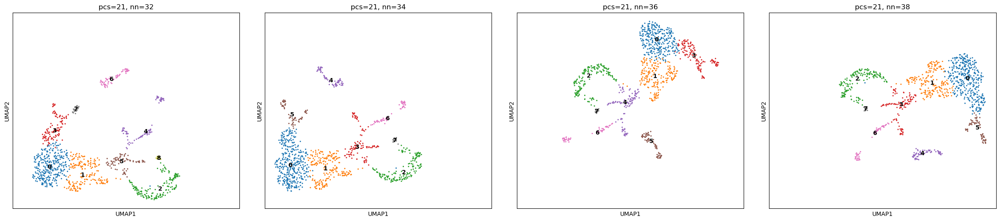


▶ Batch 19/57 | Combos 73–76


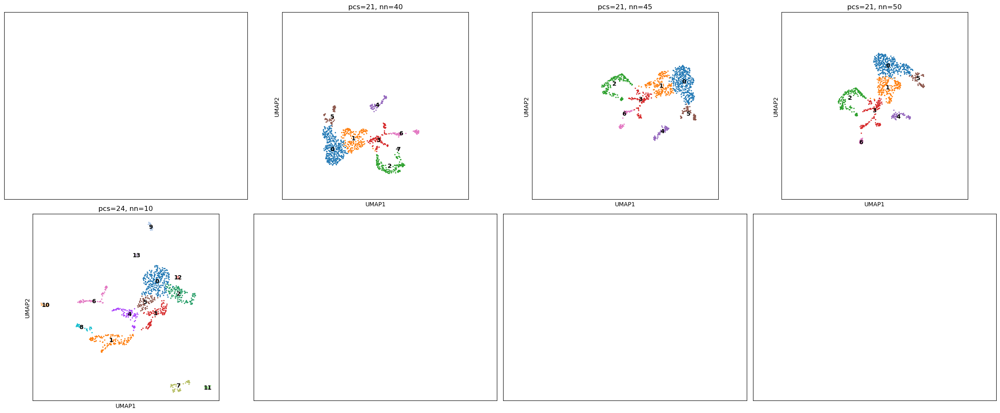


▶ Batch 20/57 | Combos 77–80


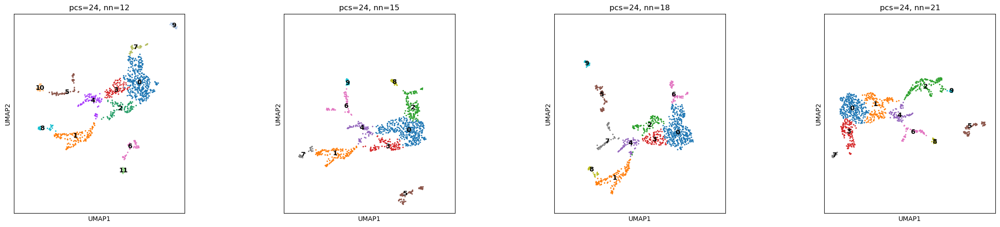


▶ Batch 21/57 | Combos 81–84


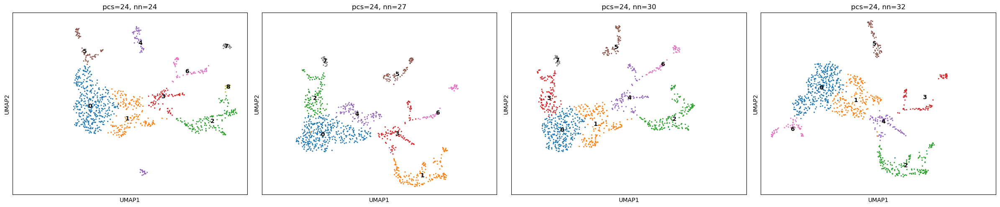


▶ Batch 22/57 | Combos 85–88


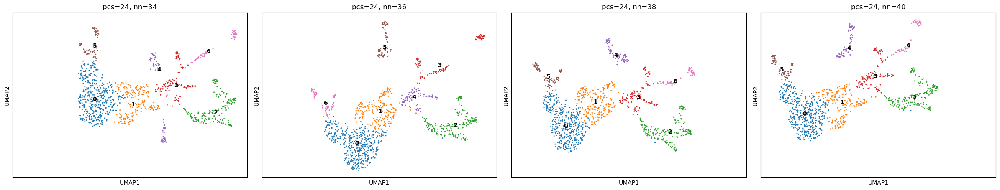


▶ Batch 23/57 | Combos 89–92


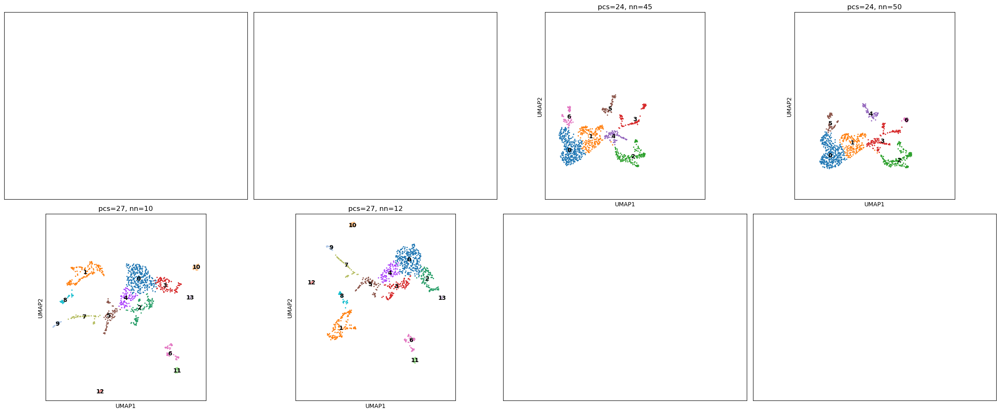


▶ Batch 24/57 | Combos 93–96


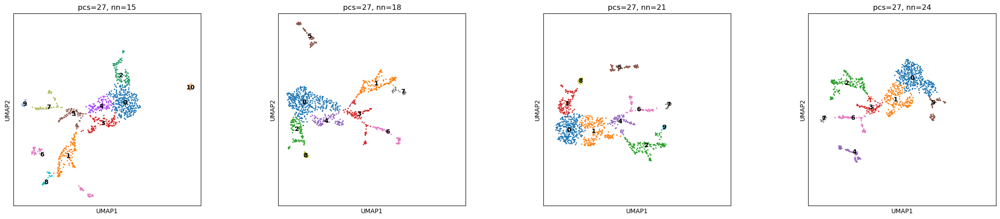


▶ Batch 25/57 | Combos 97–100


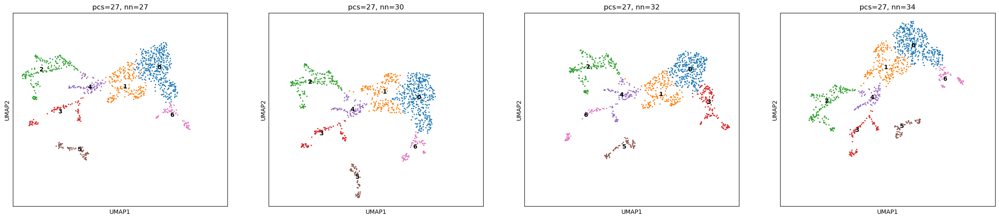


▶ Batch 26/57 | Combos 101–104


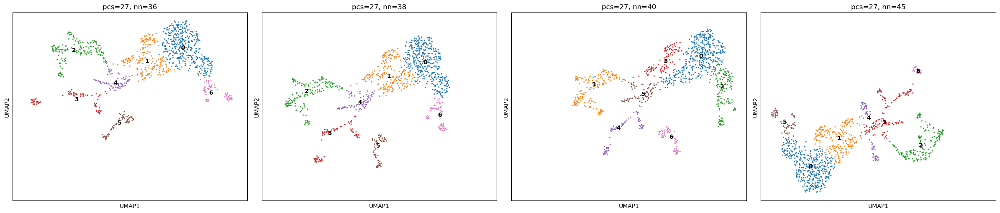


▶ Batch 27/57 | Combos 105–108


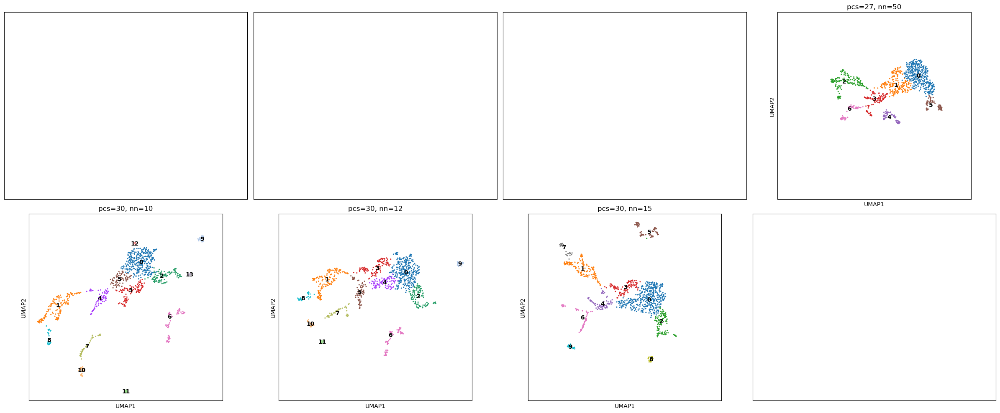


▶ Batch 28/57 | Combos 109–112


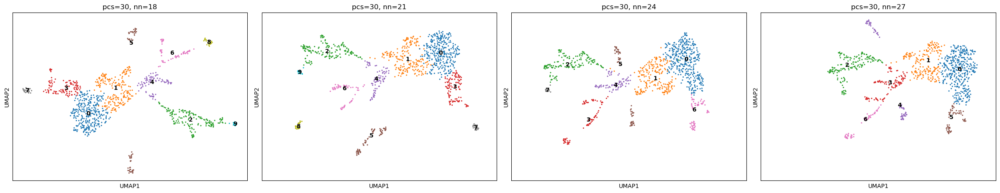


▶ Batch 29/57 | Combos 113–116


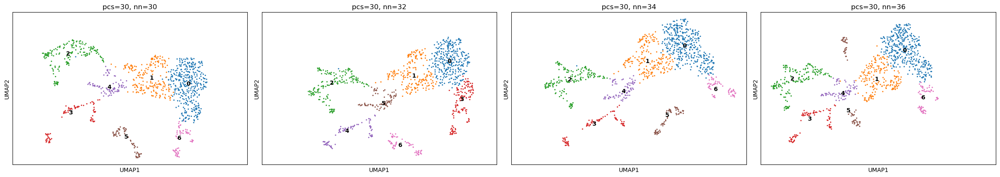


▶ Batch 30/57 | Combos 117–120


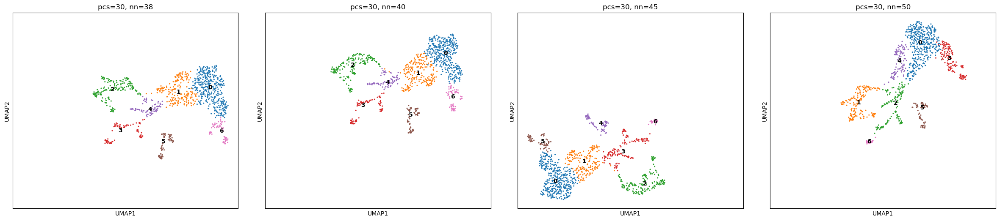


▶ Batch 31/57 | Combos 121–124


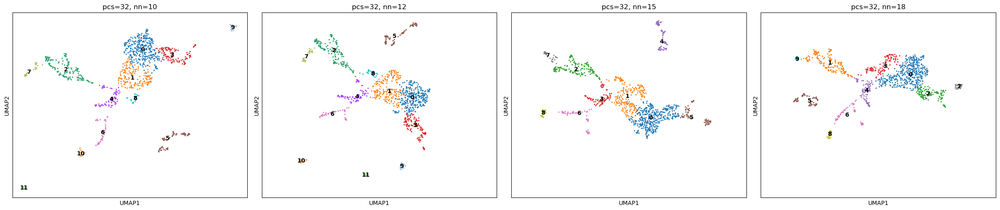


▶ Batch 32/57 | Combos 125–128


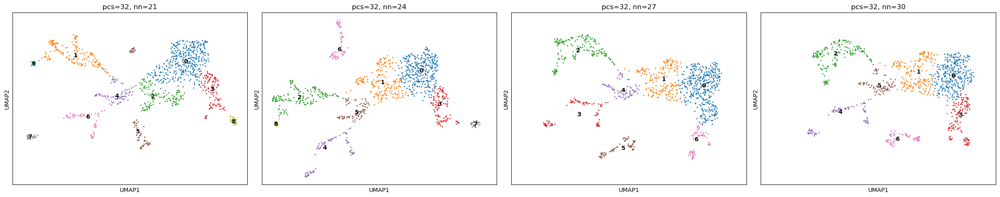


▶ Batch 33/57 | Combos 129–132


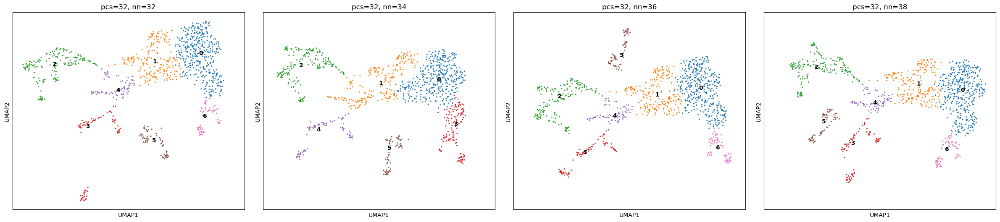


▶ Batch 34/57 | Combos 133–136


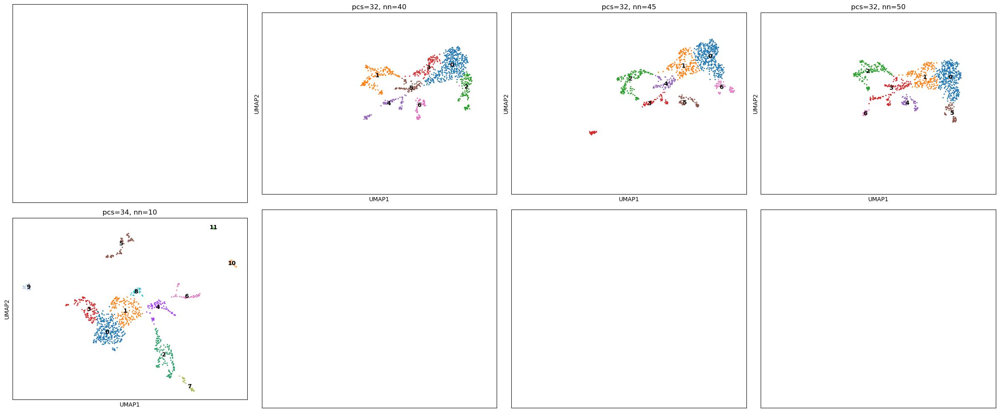


▶ Batch 35/57 | Combos 137–140


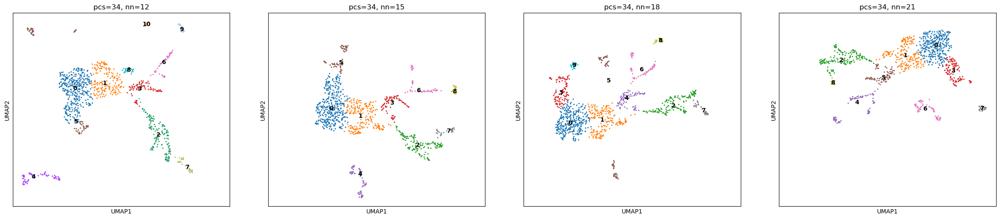


▶ Batch 36/57 | Combos 141–144


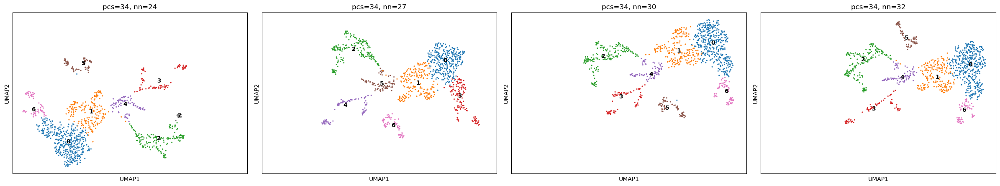


▶ Batch 37/57 | Combos 145–148


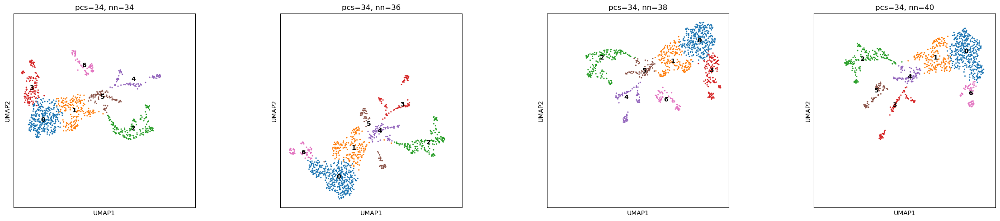


▶ Batch 38/57 | Combos 149–152


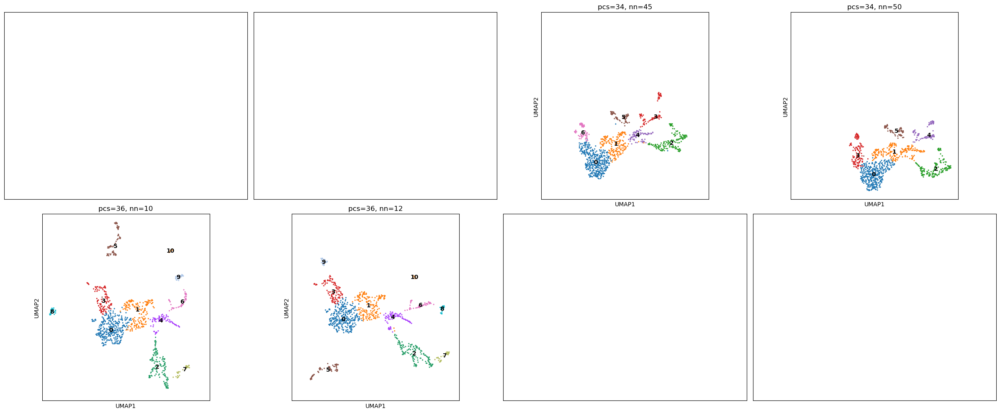


▶ Batch 39/57 | Combos 153–156


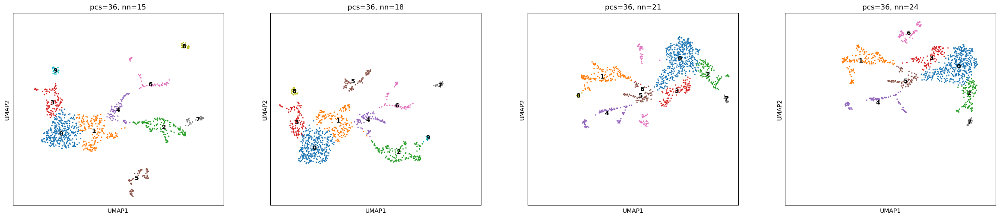


▶ Batch 40/57 | Combos 157–160


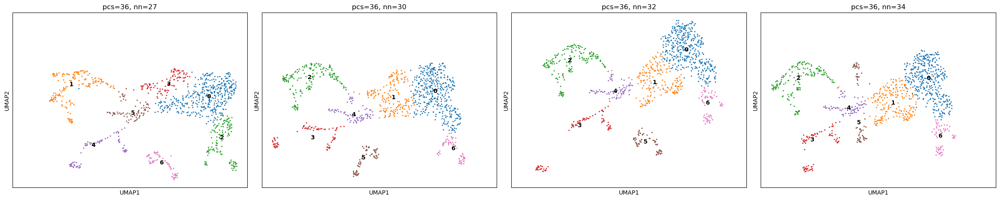


▶ Batch 41/57 | Combos 161–164


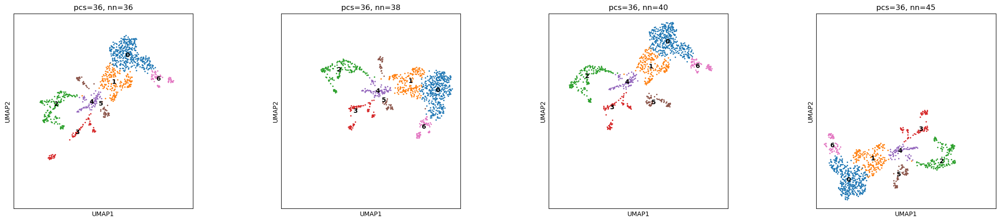


▶ Batch 42/57 | Combos 165–168


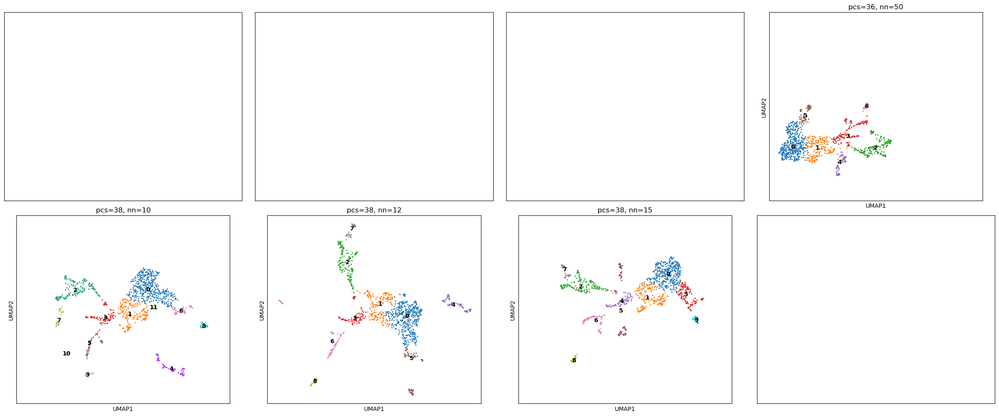


▶ Batch 43/57 | Combos 169–172


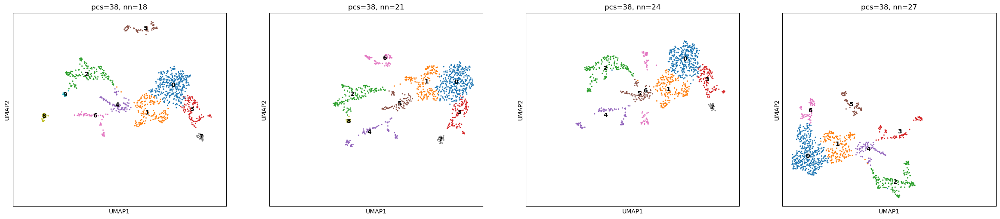


▶ Batch 44/57 | Combos 173–176


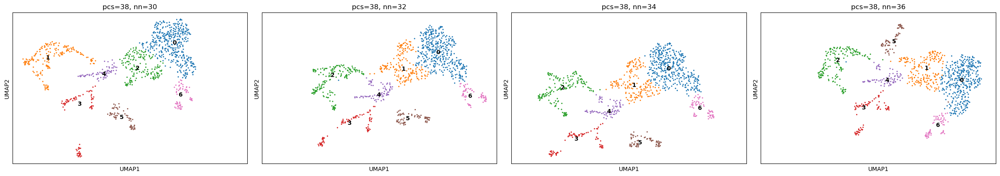


▶ Batch 45/57 | Combos 177–180


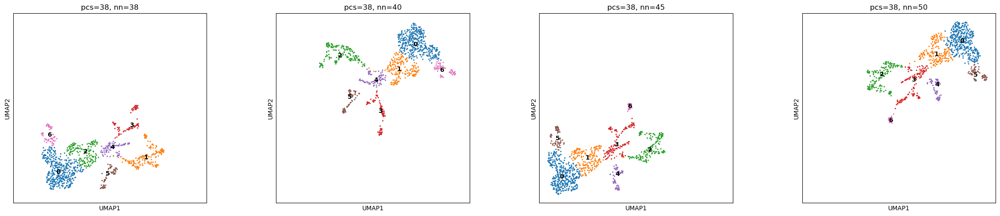


▶ Batch 46/57 | Combos 181–184


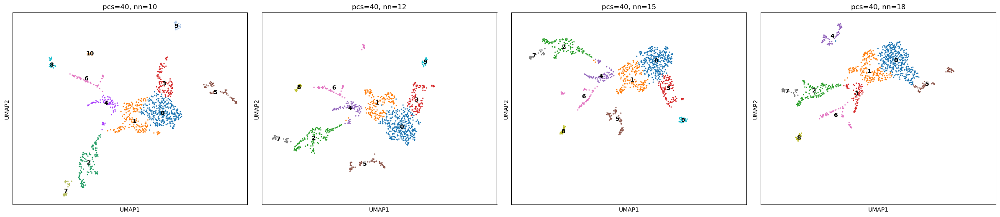


▶ Batch 47/57 | Combos 185–188


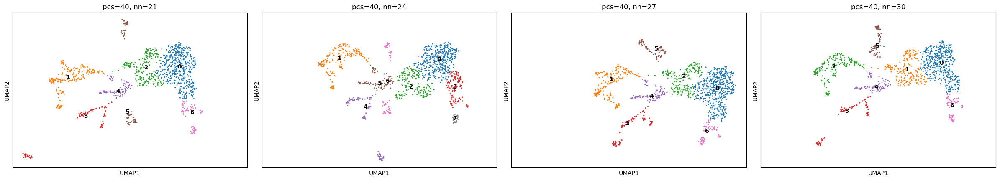


▶ Batch 48/57 | Combos 189–192


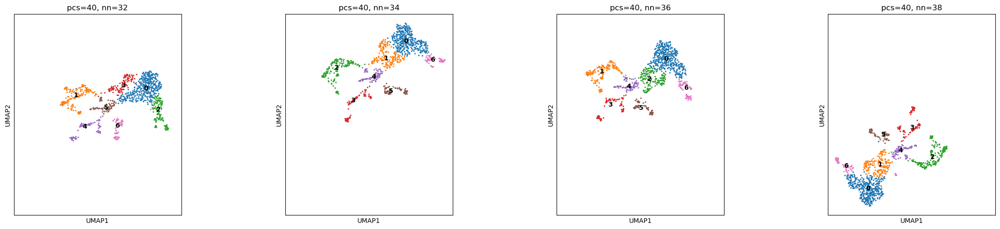


▶ Batch 49/57 | Combos 193–196


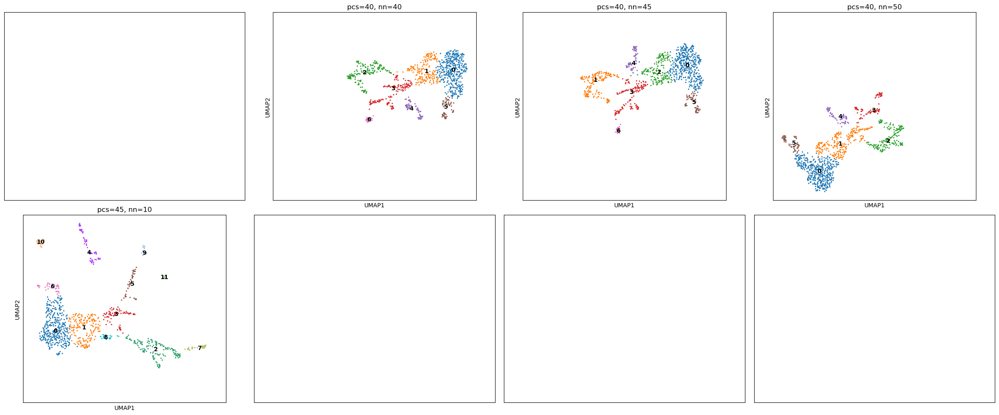


▶ Batch 50/57 | Combos 197–200


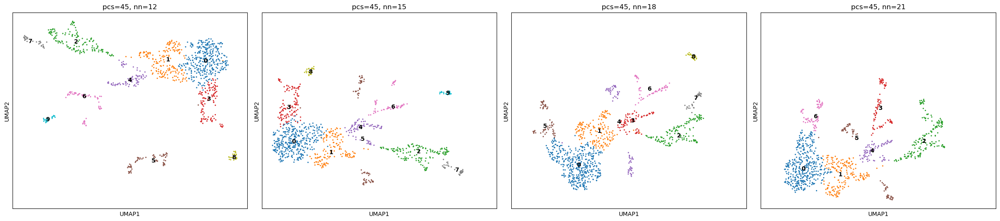


▶ Batch 51/57 | Combos 201–204


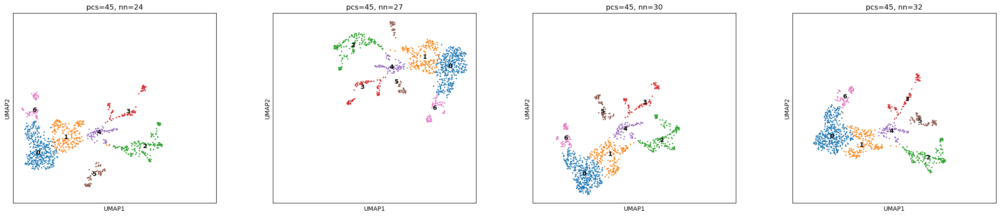


▶ Batch 52/57 | Combos 205–208


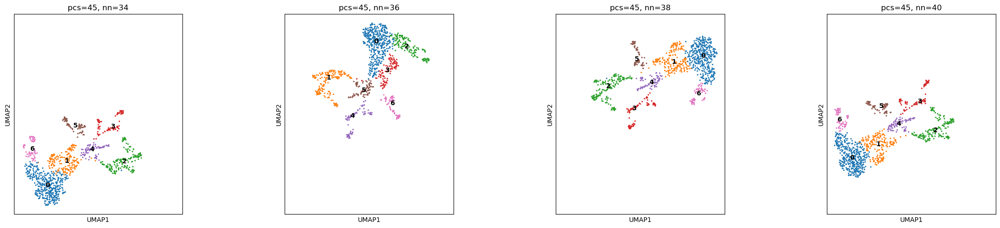


▶ Batch 53/57 | Combos 209–212


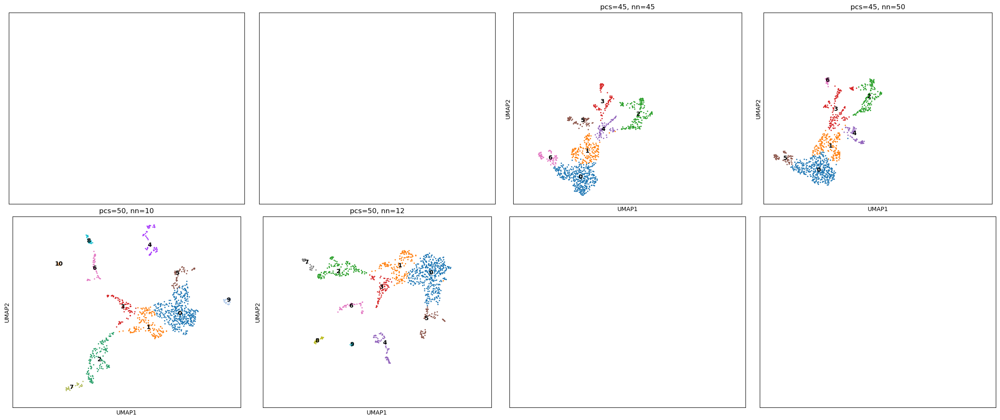


▶ Batch 54/57 | Combos 213–216


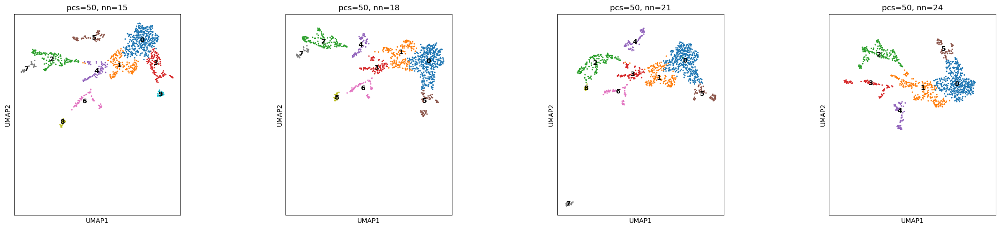


▶ Batch 55/57 | Combos 217–220


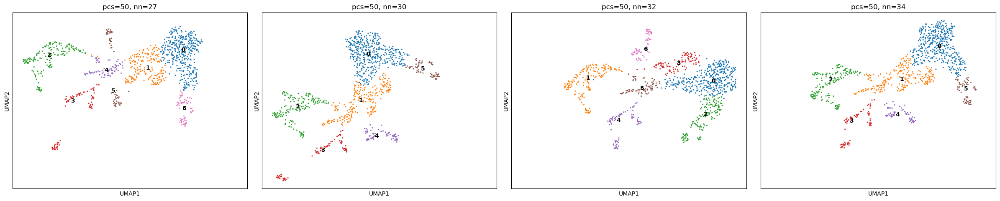


▶ Batch 56/57 | Combos 221–224


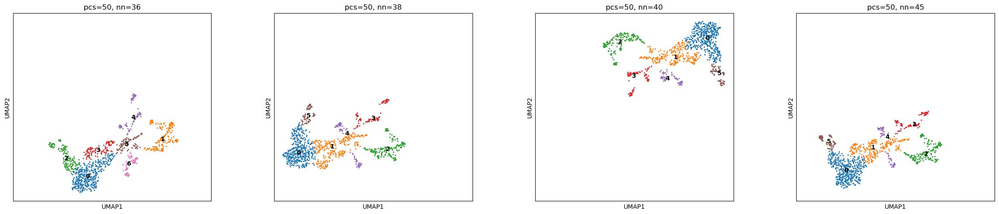


▶ Batch 57/57 | Combos 225–225


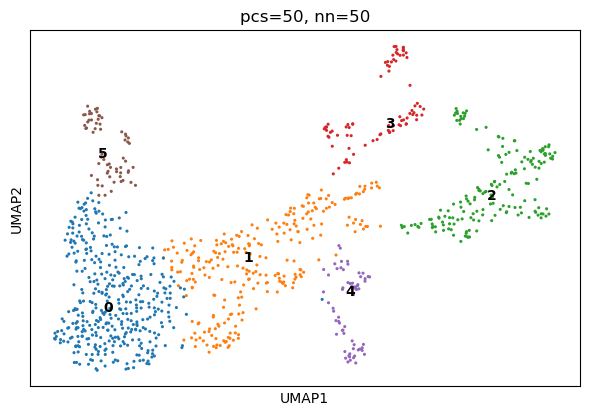

In [20]:
# --- USER PARAMETERS ---
n_pcs_list = [10, 12, 15, 18, 21, 24, 27, 30, 32, 34, 36, 38, 40, 45, 50]
n_neighbors_list = [10, 12, 15, 18, 21, 24, 27, 30, 32, 34, 36, 38, 40, 45, 50]
n_jobs = 4                # Adjust based on memory (10 x ~4GB = ~40GB usage)
batch_size = n_jobs        # Jobs per batch = number of parallel workers
seed=13

resolution = 0.3
point_size = 20
max_pcs = max(n_pcs_list)

# --- INPUT DATA ---
adata_subset_test = adata_subset.copy()
sc.tl.pca(adata_subset_test, n_comps=50, svd_solver='arpack',random_state=seed)

adata_temp = adata_subset_test.copy()


# --- GRID ---
param_grid = [(pcs, nn) for pcs in n_pcs_list for nn in n_neighbors_list]
n_total = len(param_grid)
n_batches = int(np.ceil(n_total / batch_size))

# --- UMAP Function ---
def compute_umap_npc_nn(n_pcs, n_neighbors):
    adata_temp = adata_subset_test.copy()
    sc.pp.neighbors(adata_temp, n_neighbors=n_neighbors, n_pcs=n_pcs,random_state=seed)
    sc.tl.umap(adata_temp,random_state=seed)
    sc.tl.leiden(adata_temp, resolution=resolution,random_state=seed)
    return adata_temp, n_pcs, n_neighbors

# --- RUN BATCHES ---
for batch_i in range(n_batches):
    start = batch_i * batch_size
    end = min((batch_i + 1) * batch_size, n_total)
    batch = param_grid[start:end]

    print(f"\n▶ Batch {batch_i+1}/{n_batches} | Combos {start+1}–{end}")
    #print(adata_temp.obs["leiden"].value_counts(dropna=False))

    results = Parallel(n_jobs=n_jobs)(
        delayed(compute_umap_npc_nn)(pcs, nn) for pcs, nn in batch
    )

    # Grid dimensions
    unique_pcs = sorted(set(pcs for pcs, _ in batch))
    unique_nn = sorted(set(nn for _, nn in batch))
    n_rows = len(unique_pcs)
    n_cols = len(unique_nn)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5), sharex=True, sharey=True)

    # If only one row or col, axes is not 2D
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    for i, (adata_temp, n_pcs, n_neighbors) in enumerate(results):
        row = unique_pcs.index(n_pcs)
        col = unique_nn.index(n_neighbors)
        ax = axes[row, col]

        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"pcs={n_pcs}, nn={n_neighbors}",
            ax=ax,
            show=False,
            legend_loc="on data",
            size=point_size,
            cmap="viridis"
        )
        ax.set_aspect("equal")

    plt.tight_layout()
    plt.show()

In [26]:
# Set UMAP parameter grid
min_dist_list = [0.0005, 0.001, 0.002, 0.005,0.01, 0.025, 0.05,.06,0.07, 0.08, 0.1,.12,0.15, 0.18, 0.2, 0.25, 0.3,
    0.35, 0.4,.45,0.5,.55 ,0.6,.65, 0.7, 0.8,.85, 0.9, 1.0]

spread_list = [
    0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4,
    1.5, 1.6, 1.7, 1.8, 1.9, 2.0,
    2.1, 2.2, 2.3, 2.5
]
n_jobs = 4
batch_size = n_jobs
n_pcs = 27
n_neighbors = 30
resolution = 0.3
point_size = max(10, 60 - 5 * max(len(min_dist_list), len(spread_list)))
seed=13

# --- INPUT DATA ---
adata_transformed = adata_combined.copy() 
adata_subset_test = adata_transformed.copy()
sc.tl.pca(adata_transformed, n_comps=50, svd_solver='arpack',random_state=seed)


# --- GRID ---
param_grid = [(md, sp) for md in min_dist_list for sp in spread_list]
n_total = len(param_grid)
n_batches = int(np.ceil(n_total / batch_size))

# --- UMAP Function ---
def compute_umap_data(min_dist, spread):
    adata_temp = adata_subset_test.copy()
    sc.pp.neighbors(adata_temp, n_pcs=n_pcs, n_neighbors=n_neighbors,random_state=seed)
    sc.tl.umap(adata_temp, min_dist=min_dist, spread=spread,random_state=seed)
    sc.tl.leiden(adata_temp, resolution=resolution,random_state=seed)
    return adata_temp, min_dist, spread

# --- RUN BATCHES ---
for batch_i in range(n_batches):
    start = batch_i * batch_size
    end = min((batch_i + 1) * batch_size, n_total)
    batch = param_grid[start:end]

    print(f"\n▶ Batch {batch_i+1}/{n_batches} | Combos {start+1}–{end}")
    #print(adata_temp.obs["leiden"].value_counts(dropna=False))
    
    results = Parallel(n_jobs=n_jobs)(
        delayed(compute_umap_data)(md, sp) for md, sp in batch
    )

    # Unique values in this batch (not always full list)
    unique_md = sorted(set(md for md, _ in batch))
    unique_sp = sorted(set(sp for _, sp in batch))
    n_rows = len(unique_md)
    n_cols = len(unique_sp)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5), sharex=True, sharey=True)

    # Handle 1D axis edge cases
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    for i, (adata_temp, min_dist, spread) in enumerate(results):
        row = unique_md.index(min_dist)
        col = unique_sp.index(spread)
        ax = axes[row, col]

        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"({n_pcs},{n_neighbors})_min_dist={min_dist}, spread={spread}",
            ax=ax,
            show=False,
            legend_loc="on data",
            size=point_size,
            #cmap="viridis"
        )
        ax.set_aspect("equal")

    plt.tight_layout()
    plt.show()

NameError: name 'adata_combined' is not defined

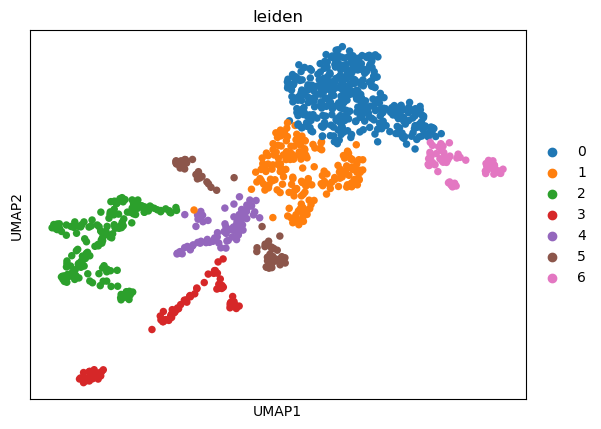

In [21]:
#final subset UMAP
seed=13
adata_subset_test=adata_subset.copy()
sc.tl.pca(adata_subset_test, n_comps=50, svd_solver='arpack',random_state=seed)
sc.pp.neighbors(adata_subset_test, n_pcs=36, n_neighbors=36,random_state=seed)  
sc.tl.umap(adata_subset_test,random_state=seed)#,min_dist=.1,spread=1.2)
sc.tl.leiden(adata_subset_test, resolution=0.3,random_state=seed)
sc.pl.umap(adata_subset_test, color="leiden", cmap="viridis",#legend_loc="on data",
         #save=f"_subset_combined_umap.pdf 
          )

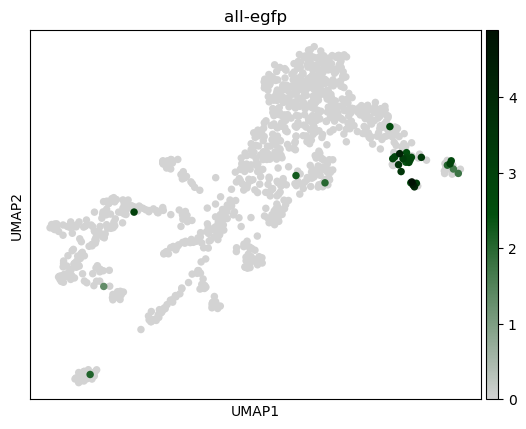

In [23]:
gene="egfp"
sc.pl.umap(
    adata_subset_test,
    color=gene,
    title=f"all-{gene}",
    show=True,
    cmap=gray_green,
       #save=f"_subset_gene_umap_{sample}-{gene}.pdf 
    )

In [25]:
adata_subset_test.write(f"/blue/square.t/peter.huynh/jupyter/combined_samples_scvelo/p4/data/processed/p4_adata_subset_({n_pcs},{n_neighbors}))_8_3_25.h5ad")

In [ ]:
#testing gene on different samples
gene="calb2a"
for sample in adata_subset_test.obs["sample"].unique():
    sc.pl.umap(
        adata_subset_test[adata_subset_test.obs["sample"] == sample],
        color=gene,
        title=f"{sample}-{gene}",
        show=True,
        cmap=gray_green,
       #save=f"_subset_gene_umap_{sample}-{gene}.pdf 
    )

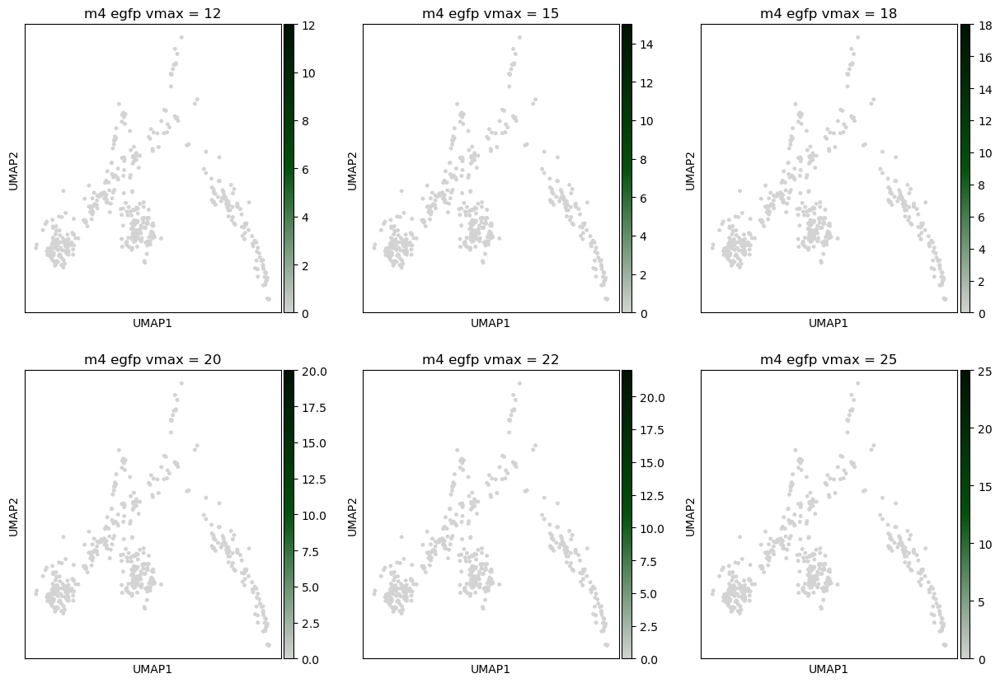

In [35]:
#testing different vmax on same sample
sample='m4'
adata_sample = adata_subset_test[adata_subset_test.obs["sample"] == f"{sample}"].copy()

vmax_values = [12,15,18,20,22,25]
#vmax_values = [2,5,8,10,12,6]

ncols = 3
nrows = (len(vmax_values) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 5 * nrows))

axes = axes.flatten()

for i, vmax in enumerate(vmax_values):
    ax = axes[i]
    sc.pl.umap(
        adata_sample,
        color="egfp",
        vmin=0,
        vmax=vmax,
        size=50,
        title=f"{sample} egfp vmax = {vmax}",
        cmap=gray_green,
        show=False,
        ax=ax  
    )

In [ ]:
sample='m4'
gene='egfp'
adata_sample = adata_subset_test[adata_subset_test.obs["sample"] == f"{sample}"].copy()
sc.pl.umap(
    adata_sample,
    color=gene,
    vmin=0,
    vmax=18,
    size=50,
    title=f'{sample}_{gene}',
    cmap=gray_softorange_orangered,
    #save=f"_subset_umap_{sample}_{gene}.pdf"
)